#End-to-end Multi-class Dog Breed Classification

This notebook builds an end to end multi-class image classifier using tensorflow 2.0 and tensorflow hub.

## 1.Problem
Identifying a dog's breed from its image

## 2. Data
The data we're using is from kaggle's dog breed identification competetion

https://www.kaggle.com/c/dog-breed-identification/data



## 3. Evaluation

The evaluation is a file with prediction for each dog breed of each test image.

## 4. Features
Some information about the data:
* we're dealing with images (Unstructured data) so it's probably best we use deep learning/transfer learning.
*There are 120 breeds of dogs(this means there are 120 different classes).
*There are around 10,000+ images in the training set
*There are 10000+ images in the test set





In [ ]:
#!unzip "drive/MyDrive/dog vision/dog-breed-identification.zip" -d "drive/MyDrive/dog vision"

### Get Our workspace ready

* Import Tensflow 2.x
* Import tensorflow hub(To pick a model to suit our problem)
* Make Sure we're using a GPU


In [ ]:
#import tensforflow
import tensorflow as tf
print("TF version:",tf.__version__)
import tensorflow_hub as hub
print(hub.__version__)
#check for GPU is avilable
print("GPU","Available" if tf.config.list_physical_devices("GPU") else "Not Available")

TF version: 2.9.2
0.12.0
GPU Available


## Getting our data ready(convert into the numbers)

In [ ]:
#Checkout the labels of our data

import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/dog vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())



                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


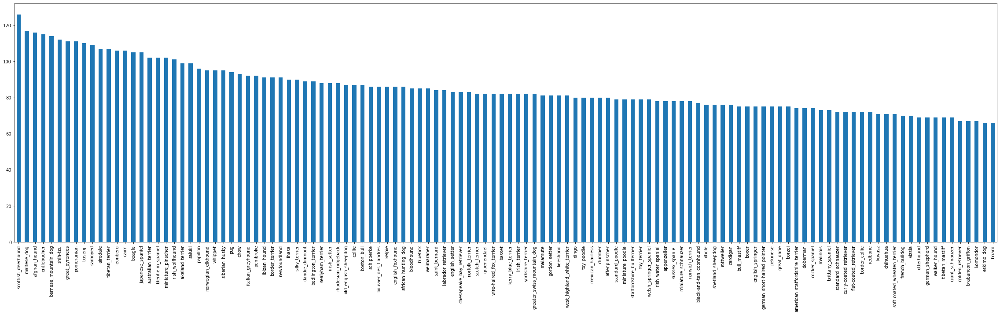

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(40,10));

In [ ]:
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

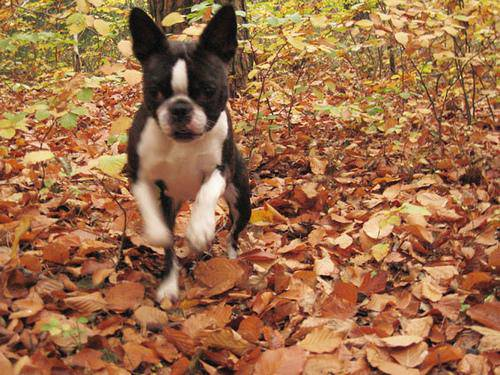

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

## Getting images and labels


In [ ]:
# Create pathnames from images ID's
filename=[fname for fname in labels_csv["id"]]
filename

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64',
 '004396df1acd0f1247b740ca2b14616e',
 '0067dc3eab0b3c3ef0439477624d85d6',
 '00693b8bc2470375cc744a6391d397ec',
 '006cc3ddb9dc1bd827479569fcdc52dc',
 '0075dc49dab4024d12fafe67074d8a81',
 '00792e341f3c6eb33663e415d0715370',
 '007b5a16db9d9ff9d7ad39982703e429',
 '007b8a07882822475a4ce6581e70b1f8',
 '007ff9a78eba2aebb558afea3a51c469',
 '008887054b18ba3c7601792b6a453cc3',
 '008b1271ed1addaccf93783b39deab45',
 '008ba178d6dfc1a583617470d19c1673',
 '009509be3ca7cce0ff9e37c8b09b1125',
 '0097c6242c6f3071762d9f85c3ef1b2f',
 '00a338a92e4e7bf543340dc849230e75',
 '00a366d4b4a9bbb6c8a63126697b7656',
 '00a862390341c5be090dd72bd2bc19ef',
 

In [ ]:
imgs=["drive/MyDrive/dog vision/train/"+fname+".jpg" for fname in labels_csv["id"]]

imgs[:10]

['drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
#check whether number of imgs matches with number of images in actual file

import os
if len(os.listdir("drive/MyDrive/dog vision/train/"))==len(imgs):
  print("matched")
else:
  print("Not matched")

matched


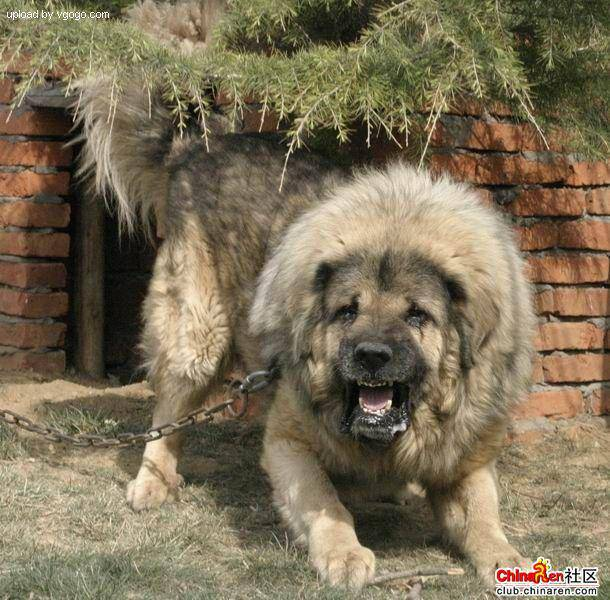

In [ ]:
Image(imgs[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels=labels_csv["breed"]
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
 labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# Let's find the unique breeds
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
#turn evry labels into a boolean array
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
#example: Turning a boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds==labels[0])) #where label occurs
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating Our Own validation set

In [ ]:
#Setup X & Y labels
x=imgs
y=boolean_labels

We're going to start off experimenting with 1000 images and increasing as needed.

In [ ]:
#Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}


In [ ]:
#Split them into training and validation of total size NUM_IMAGEs
from sklearn.model_selection import train_test_split

x_train,x_val,y_train,y_val=t=train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

In [ ]:
len(x_train)

800

Preprocessing images(turning images to tensors)


1. To take image filepath as input
2. Use Tensorflow to read the file and save it to a variable image
3.turn Our image into tensor
4.Normalize our image (convert color channels values from 0-255 to 0-1)
4. Resize the image to be a shape (224,224)
5. Return the modified image

In [ ]:
# let's see how image look like in numpy array
#convert image into numpy array

from matplotlib.pyplot import imread
image=imread(imgs[42])
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
#Turn image into tensor
tf.constant(image[:2])

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image look like as a tensor, Let's make a function to preprocess them.

In [ ]:
#Define img size
IMG_SIZE=224
#create a function for preprocessing images

def process_image(image_path):
  #Read a image
  image=tf.io.read_file(image_path)
  #Turn the image into numerical tensor with 3 colour channels(Red,Green,blue)
  image=tf.image.decode_jpeg(image,channels=3)
  #Convert the colour channel vaues from 0-255 to 0-1 values(It will make it more efficient image is in 0-255 numbers but using this it is converted to 0-1 )
  image=tf.image.convert_image_dtype(image,tf.float32)
  #resize
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image




#Turning Our data into batches
Why turn our data into batches?
Let's say You  are trying 9to process 10,000+ images in one go they all might not fit into memory

so that's why we do about 32 imagees at a time

In order to use tensor flow effectively, we need our data int he form of tensor tuples which look like this: (image,label)

In [ ]:
#create a simple function to return a tuple (image,label)
def get_image_label(image_path,label):
  image=process_image(image_path)
  return image,label


Now we've got a way to turn  our data into tuples of Tensors in the form (x,y) , Let's make a function to turn all our data into batches


In [ ]:
#Define a batch size
batch_size=32

#Create a function
def create_data_batches(x,y=None,batch_size=batch_size,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  shuffles the data if it's a training data but doesn't shuffles if it's a validation data
  Also accepts test data as input (no labels)
  """
  #if the data is test dataset,we probably don't have have labels

  if test_data:

    print("Create test data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x))) #only filepaths( no labels)
    data_batch=data.map(process_image).batch(batch_size)
    return data_batch

  # if data is a valid dataset,we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),#filepaths
                                             tf.constant(y)))#labels
    data_batch=data.map(get_image_label).batch(batch_size)
    return data_batch
  else:
    print("Creating training data batches")
    #Turn filepaths and labels into tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),#filepaths
                                             tf.constant(y)))#labels
    #shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data=data.shuffle(buffer_size=len(x))
    #Create (image,label) tuples(this also turns the image path into a preprocessed image)
    data=data.map(get_image_label)

    data_batch=data.batch(batch_size)
    return data_batch



In [ ]:
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

Creating training data batches
Creating validation data batches


In [ ]:
#check out the differnt attributes of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data Batches

Our Data is now in batches, however, these can be a little hard to understand,Let's visualize them


In [ ]:
import matplotlib.pyplot as plt

#Create a function for iewing images in a data batch
def show_25_images(images,labels):
  """
  displays a plot of  25 images and their labels from adata batch
  """
  # Setup a figure
  plt.figure(figsize=(20,20))
  # loop through 25 for displaying 25 images
  for i in range(25):
    # Create subplots (5 rows,5 cols)
    ax=plt.subplot(5,5,i+1)
    # display an image
    plt.imshow(images[i])
    # add the image label as thetitle
    plt.title(unique_breeds[labels[i].argmax()])  # y[0].argmax==19



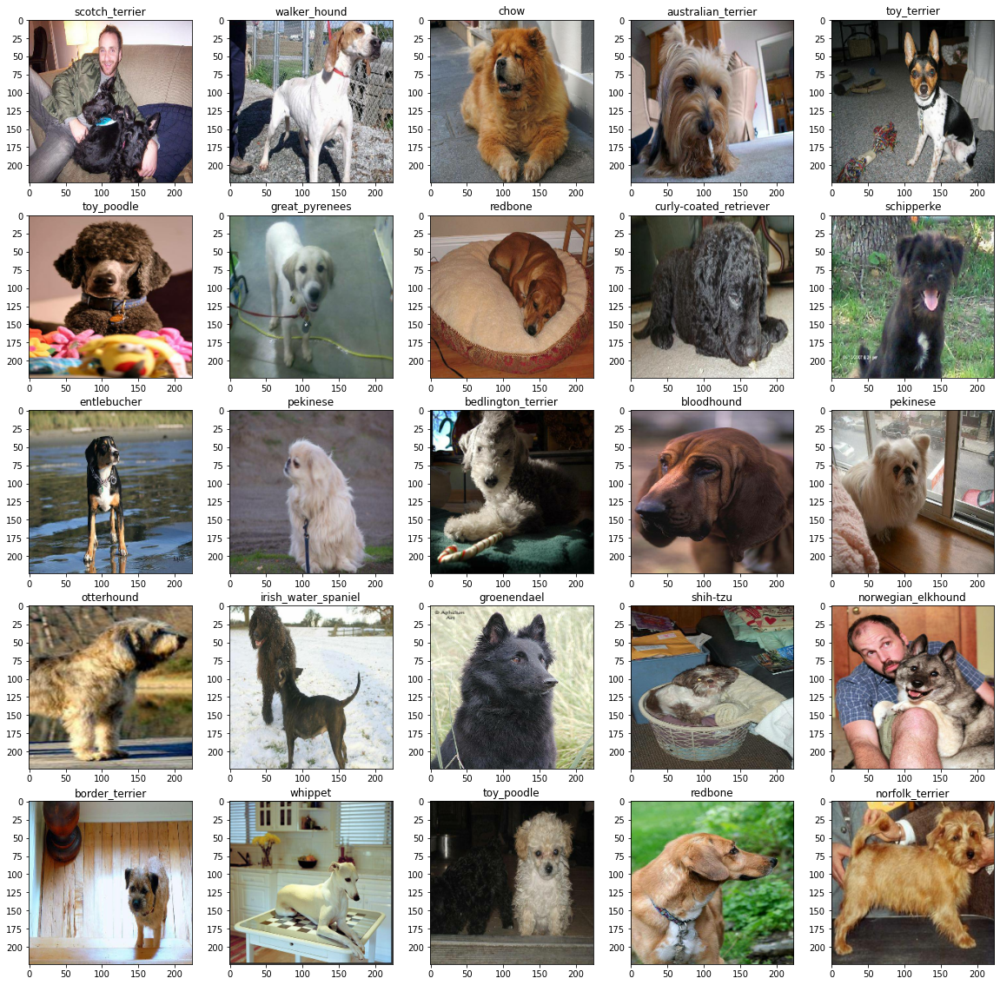

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

# Building a model
###Before we build a model,there are afew things we need to define

####  * The input shape(Our images shapes, in form of tensors) to our model

####  * The output shape of our model

####  * The URL of the model we want to use from tensorflowhub https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5



In [ ]:
IMG_SIZE

NameError: ignored

In [ ]:
# Setup input shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] #BATCH,HEIGHT,WIDTH,COLOR CHANNELS

#Setup output shape of our model
OUTPUT_SHAPE=len(unique_breeds)
# Setup model URL from tensorflow hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

### Now we've got our inputs,outputs and model  ready to go. Let's put them together into a keras deep learning model!

knowing this,let's create a function which:
* Takes the input shapes,Output shape and the model we've chosen as parameter
* Defines the layers in a keras model in sequential fashion(do this first, then this, then that)
* Compiles the model(say it should be evaluated and improved)
* Builds the model(tells the model the input shape itc will be getting)
* Return the model

In [ ]:
# Create a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):

  # Setup the model here
  model=tf.keras.Sequential([ hub.KerasLayer(model_url) #LAyer 1 (input layer) It is telling tf to create keras layerof model url
                              , tf.keras.layers.Dense(units=output_shape, activation="softmax") #Layer 2 (output layer)  We wnat outputs in 120 as our our unique_breeds have 120 different breeds

                            ])

  # compile The model
  model.compile(
                loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"]
  )

  #Build the model
  model.build(input_shape)
  return model

In [ ]:
model=create_model()
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_2 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as save its progess,check its progess or stop early if model stops improving.

we will create two callbacks, One is for Tensorboard which tracks our model progress and another for early stopping Which prevent our model for training for too long.

## TensorBoard Callback
 In order to tensorboard callback we need to do 3 thins:
 * Load the tensor notebook extension
 * Create a tensorboard callback which is able to save logs to directory and pass to our model's fit() function
 * Visualize Our Models training logs with the tensorboard magic function(we do this after model training )


In [ ]:
# Load tensorboard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime

#Create a function to build a tensorflow callback
def create_tensorboard_callback():
  logdir=os.path.join("/content/drive/MyDrive/dog vision/logs",
                      #make it so logs get tracked whenevr we run an experiment
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping Callback

Early stopping prevents our model to overfiting by stopping training if a certain evaluation metric stops improving

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# creating a early stopping callback
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

### Training a model(On Subset of data)

Our first model is only going to train on 1000 images, to make sure everything in working properly

In [ ]:
NUM_EPOCHS=100 #@param {type:"slider",min: 10, max: 100,step:10}

In [ ]:
# Make sure Whether GPU is available or not
print(" GPU","available" if tf.config.list_physical_devices("GPU") else "Not Available")

 GPU available


#### Let's Create a function that trains the Model

* Create a model using *create_model()*
*  Create a Tensorboard callback using *create_tensorboard_callback()*
* Call the *fit()* function on our moodel passing training data, validatin data, NUM_EPOCHS to train for and callbacks we'de like to use
* Return The Model

In [ ]:
# Building a function
def train_model():
  model=create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard=create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model

In [ ]:
#model=train_model()
%timeit

*Question*: It's looking like that our model is overfitting because it is performing far better than on training data rather on validation dataset. So what are d/f ways to prevent it from overfitting Deep learning neural networks?

### Checking the tensorboard logs

The TensorBoard Magic Function(%tensorboard) will acess the logs directory we have created earlier and visualize its

In [ ]:
%tensorboard --logdir drive/MyDrive/dog\ vision/logs


Reusing TensorBoard on port 6006 (pid 1157), started 0:06:58 ago. (Use '!kill 1157' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make Predictions on Our Validation Data
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 7s 946ms/step


array([[0.00781352, 0.00101123, 0.01918511, ..., 0.0015463 , 0.00705517,
        0.00080244],
       [0.01269194, 0.02596342, 0.03210846, ..., 0.00305166, 0.00838643,
        0.00126372],
       [0.00493697, 0.00047841, 0.00417383, ..., 0.0016868 , 0.01307665,
        0.00266895],
       ...,
       [0.11669902, 0.00118028, 0.00151881, ..., 0.00939194, 0.02002765,
        0.00695464],
       [0.01131212, 0.0075913 , 0.00261047, ..., 0.00054904, 0.0217607 ,
        0.00054139],
       [0.00292246, 0.00637096, 0.04511308, ..., 0.01249578, 0.00147798,
        0.00103981]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[0]

array([0.00781352, 0.00101123, 0.01918511, 0.00086628, 0.01359332,
       0.05127539, 0.00232513, 0.00178551, 0.00221671, 0.00591953,
       0.00159148, 0.00779108, 0.00418276, 0.0045252 , 0.00717897,
       0.00439309, 0.00300735, 0.00200273, 0.00536374, 0.03974732,
       0.00042863, 0.01585611, 0.00049468, 0.00334073, 0.00069162,
       0.00197872, 0.00089099, 0.00238744, 0.0017762 , 0.00406506,
       0.00213349, 0.00466814, 0.00633213, 0.01450501, 0.00695409,
       0.00151122, 0.00495431, 0.13419129, 0.00246162, 0.0004365 ,
       0.02294882, 0.00487149, 0.00407076, 0.00084177, 0.00472648,
       0.00490565, 0.00056395, 0.00856174, 0.00867488, 0.00947598,
       0.00618903, 0.00080945, 0.00187664, 0.00435331, 0.0002605 ,
       0.00510565, 0.01352358, 0.01211846, 0.00539669, 0.00037175,
       0.0078082 , 0.00161618, 0.0055446 , 0.00271689, 0.00921102,
       0.0186911 , 0.00330255, 0.00242807, 0.00458118, 0.01123296,
       0.00229404, 0.00235294, 0.02873409, 0.00261932, 0.00197

In [ ]:
len(predictions[0])  # It contain probability of each breed of having

120

In [ ]:
# PRedicted label for 0th Index
index=0
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

Predicted label: dingo


In [ ]:
# Turn Prediction probalities into their labels so it is easier to understsand
def get_pred_label(prediction_probabilities):

  return unique_breeds[np.argmax(prediction_probabilities)]

predict=get_pred_label(predictions[0])
predict

'dingo'

Now since our validation is in batch size we have unbatchify it, so that we can compare it with Truth labels of validation data


In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
def unbatchify(data):

  images=[]
  labels=[]

  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)
  return images,labels

In [ ]:
val_images,val_labels=unbatchify(val_data)

Now we've got ways to get:
* Prediction labels
*validation labels(truth labels)
* Validation Images

Let's make a function to visualize all this

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n):

  pred_prob, true_label, image=prediction_probabilities[n],labels[n],images[n]

  # Get the pred label
  pred_label=get_pred_label(pred_prob)

  # Getting true label
  true_label=unique_breeds[np.argmax(labels[n])]

  # Plot The Image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change color depending upon whether prediction is true or not

  if pred_label==true_label:

    color="green"
  else:
    color="red"

  #Change the  title to be predicted,probability of prediction and true label
  plt.title("predicted: {} {:2.0f}% True Lable: {}".format(pred_label,(np.max(pred_prob))*100,true_label),color=color)

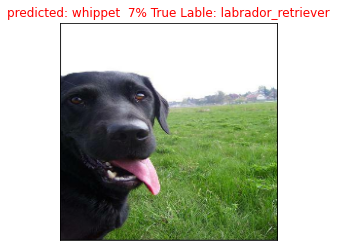

In [ ]:
plot_pred(predictions,val_labels,val_images,40)

Now we've got a function to predict model's top prediction. Let's Make another to visualize Model's top 10 predictions

This Function will:
* Predicting probability value
* Predicting Probability Indexes
* Prediction Labels
* Plot the top 10 Prediction probability values, Predicted label and color them green or red

In [ ]:
predictions[0].argsort()

array([ 54,  95, 114, 107,  59,  89,  75,  20,  39,  22, 115,  87,  46,
        24, 119,  51,  98,  43,   3,  26,   1, 103,  99, 109,  35, 117,
        10,  61,  28,   7,  52,  25,  74,  17,  30,  85, 100,   8,  70,
         6,  71, 108,  27,  67,  38,  73,  63,  90,  80,  16,  66,  76,
        23,  81, 105,  29,  42,  12,  53,  15,  13,  68,  31,  44,  41,
        45, 102,  36,  94,  55,  18,  58,  62,   9, 113,  92,  93,  50,
        32, 101, 112,  86,  34, 118,  14,  82,  11,  60,   0,  96,  47,
        48,  64,  49,  77,  69, 116,  57,  78,  56,   4,  97,  33, 110,
        21,  83,  88,  65,   2,  40,  84,  79, 111, 106,  72, 104,  19,
        91,   5,  37])

In [ ]:
predictions[0].argsort()[-10:]

array([ 84,  79, 111, 106,  72, 104,  19,  91,   5,  37])

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  pred_prob,true_label=prediction_probabilities[n],labels[n]

  # Get the predicted label
  pred_label=unique_breeds[np.argmax(pred_prob)]

  # Get The true label
  true_label=unique_breeds[np.argmax(labels[n])]

  #Find The top 10 Prediction confidence Indexes
  top_10_indexs=pred_prob.argsort()[-10:][::-1]

  # Top_10 Prediction values
  top_10_values=pred_prob[top_10_indexs]

  #Top 10 prediction Labels
  top_10_pred_labels=unique_breeds[top_10_indexs]

  # Setup Plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_values,
                   color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Color of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(true_label==top_10_pred_labels)].set_color("green")
  else:
    pass


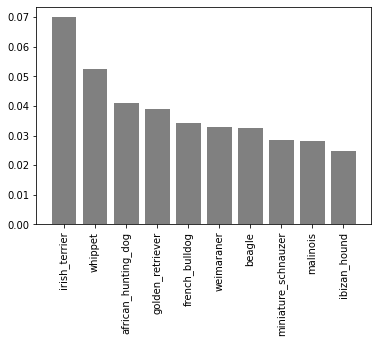

In [ ]:
plot_pred_conf(predictions,val_labels,n=77)

Now We've have got some function to visualize let's checkout some few more


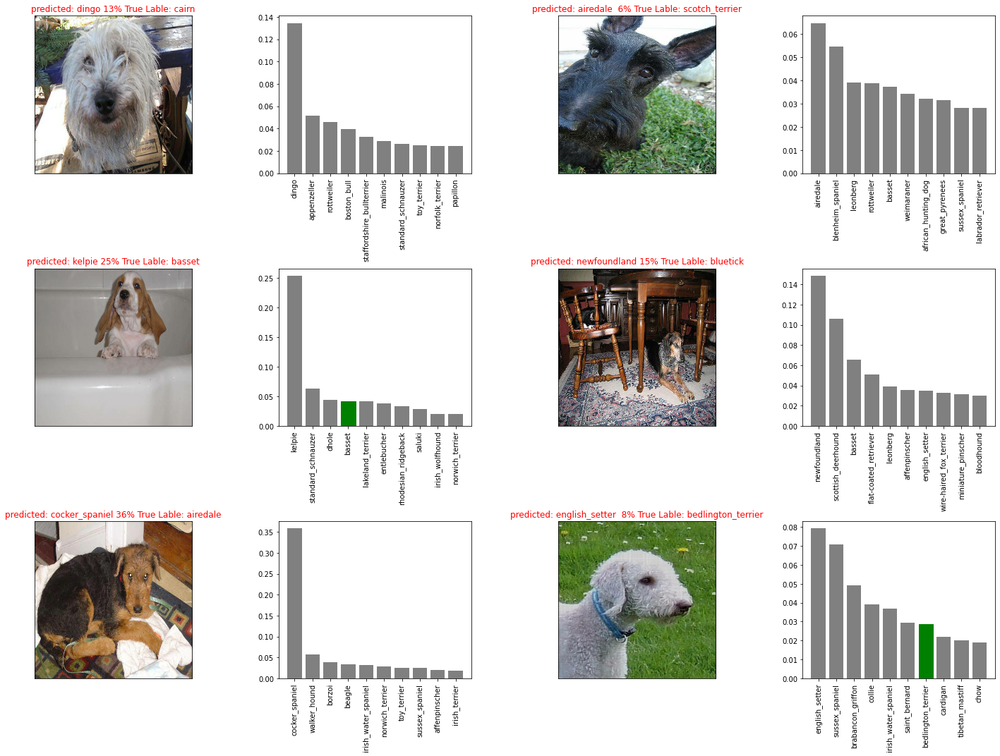

In [ ]:
i_Multiplier=0
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols,2*i+1)
  plot_pred(predictions,labels=val_labels,images=val_images,n=i+i_Multiplier)

  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(predictions,val_labels,n=i+i_Multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

# Saving and Reloading the Model

In [ ]:
# Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a model in Model Directory and Appends a Suffix (String)
  """

  modeldir=os.path.join("/content/drive/MyDrive/dog vision/model",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path=modeldir+"-"+suffix+".h5" # Format of a model File

  model.save(model_path)
  return model_path


In [ ]:
def load_model(model_path):
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save the model
#save_model(model,suffix="1000-images-mobilenetv2-Adam")

In [ ]:
# Load The Model
loaded_1000_image_model=load_model("/content/drive/MyDrive/dog vision/model/20221226-062604-1000-images-mobilenetv2-Adam.h5")

In [ ]:
# Evaluate the pre saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 93ms/step - loss: 5.6881 - accuracy: 0.0050


[5.688112735748291, 0.004999999888241291]

In [ ]:
# evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 88ms/step - loss: 1.2263 - accuracy: 0.6800


[1.226257562637329, 0.6800000071525574]

# Training model on full Data Set

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
full_data=create_data_batches(x,y)


Creating training data batches


In [ ]:
full_model=create_model()

In [ ]:
# Create full Model callbacks
full_model_tensorboard=create_tensorboard_callback()
# No Validation Set Whenn training on all the data, so we can't monitor validation accuracy

full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                           patience=3)


**NOTE**: The cell below will take a little while may be upto 30 mins or more for first epoch Because we're Using GPU and it has to load all the images into the memory


In [ ]:
#full_model.fit(x=full_data,
 #             epochs=NUM_EPOCHS,
  #            callbacks=[full_model_tensorboard,full_model_early_stopping])

In [ ]:
#save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

In [ ]:
loaded_full_model=load_model("/content/drive/MyDrive/dog vision/model/20221227-070533-full-image-set-mobilenetv2-Adam.h5")

# Making Prediction on Test Data

Since Our Model has been trained on the images in the form of Tensor Batches,To make prediction on Test data we have to go through Same Format

To Make Predictions On Test Dataset
* Get the Test Image Filenames
* Convert the filenames into test data Batches using *create_data_batches()* and setting the *test_data* parameter to true (Since test Data doesn't have labels)
* Make a prediction array by passing the test batches to predict() method called on our model

In [ ]:
test_path="drive/MyDrive/dog vision/test/"
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/dog vision/test/deec3d206b0f5c927c86ed1782990961.jpg',
 'drive/MyDrive/dog vision/test/e6a0eeb3e82e14eb812d9ef22383ec11.jpg',
 'drive/MyDrive/dog vision/test/dd7bf84df93991b7c15ec739c82acc04.jpg',
 'drive/MyDrive/dog vision/test/dcddc9135d0a138bb83a55bbc06adacc.jpg',
 'drive/MyDrive/dog vision/test/e26d745f820e6b14cae26bb5def0648f.jpg',
 'drive/MyDrive/dog vision/test/e6999e18a8e98f7fc33cf520d26ec521.jpg',
 'drive/MyDrive/dog vision/test/e3a43510b5f90bfb9fb050c77cabb079.jpg',
 'drive/MyDrive/dog vision/test/dd703c7beeaf5cba5533d5f42b608f2e.jpg',
 'drive/MyDrive/dog vision/test/e7afcce6e45858fc3b294cc5c0b15a53.jpg',
 'drive/MyDrive/dog vision/test/e08d42b2e6f2dbcf24c6bfee8b7d03bd.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create Test data batch
test_data=create_data_batches(test_filenames,batch_size=batch_size,test_data=True)

Create test data batches


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**NOTE**:  Calling Predict On full Test Data will Take Fairly a long time

In [ ]:
# MAke Prediction using loaded_full_model
test_predictions=loaded_full_model.predict(test_data,
                          verbose=1)

324/324 [==============================] - 39s 120ms/step


In [ ]:
# Save predictions(Numpy array) to csv file for acess later
np.savetxt("drive/MyDrive/dog vision/final_ans.csv", test_predictions,delimiter=",")

In [ ]:
# Load np Array from csv file
test_predictions=np.loadtxt("drive/MyDrive/dog vision/final_ans.csv",delimiter=",")

In [ ]:
test_predictions[:2]

array([[2.60278604e-12, 1.23674430e-11, 3.30418679e-11, 7.43874029e-09,
        8.39756709e-09, 3.41046338e-08, 1.79895109e-11, 2.66700073e-12,
        9.32833411e-12, 3.62915357e-11, 3.46268999e-12, 1.94488904e-11,
        1.11946372e-06, 1.73155880e-12, 4.01588736e-08, 2.48465137e-09,
        4.91857735e-11, 5.71283965e-10, 5.17268520e-12, 1.37460781e-11,
        1.26488767e-11, 3.86102067e-10, 4.83556173e-09, 6.24229444e-12,
        5.65490742e-13, 2.19777725e-08, 9.33397951e-15, 1.46649945e-13,
        1.32134703e-08, 1.94116706e-12, 1.93826200e-09, 3.03101641e-11,
        6.48278708e-10, 7.90839061e-11, 9.16416809e-08, 1.04463875e-10,
        1.01335634e-10, 2.42032401e-11, 1.21250730e-06, 1.31250273e-12,
        2.84550183e-12, 1.22272852e-13, 1.57791014e-09, 1.73468585e-12,
        1.06733766e-09, 3.30329986e-10, 4.54013632e-10, 8.08414013e-12,
        2.73724332e-09, 3.20767475e-11, 2.08561474e-07, 2.65107055e-12,
        1.59113327e-08, 4.64270133e-09, 1.49218259e-11, 7.032882

#Make The Predictions on Custom Images

To Make Prediction on custom Images, we'll
* Get the filepaths of our own images
* Turn The filepaths into data Batches using *create_data_batches()*. And Since our custom images *test_data* parameter to True
* Pass the Custom image data batch to our model's *predicts()* method
* Convert The prediction Output probabilities to prediction labels
* Compare the predicted  labels to custom images

In [ ]:
# Get Custom Image Filepaths
custom_path="drive/Mydrive/dog vision/my-photos/"
custom_image_paths=[custom_path+ fname for fname in os.listdir(custom_path)]



In [ ]:
# Turning into data batches
custom_data=create_data_batches(custom_image_paths,test_data=True)
custom_data

In [ ]:
# Predictions
custom_preds=loaded_full_model.predict(custom_data)
custom_pred_labels=[get_pred_label(custom_preds[i]) for in range(len(custom_preds))]

In [ ]:
# Get Custom images( Our Unbatchify() function won't work here Since there aren't labels....)
custom_imgs=[]
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)